In [6]:
from typing import Tuple, List, Text, Dict, Any, Iterator, Union, Sized, Callable
import sys
import os
import time
import cProfile
import pstats
import numpy as np
sys.path.append("/usr/local/Cellar/opencv3/3.2.0/lib/python3.5/site-packages/") # mac opencv path
import cv2
import skimage.io as io
from matplotlib import pyplot as plt
%matplotlib inline
from imgaug import augmenters as iaa
sys.path.append("./coco/PythonAPI/")
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask
from chainer.iterators import MultiprocessIterator, SerialIterator
from chainer.dataset import dataset_mixin
os.environ['KERAS_BACKEND'] = 'tensorflow'
from keras.backend import set_image_data_format
set_image_data_format("channels_last") # tensorflow
def mtx_plot(fnmtx, ratio):
    h = len(fnmtx[0])
    w = len(fnmtx)
    k = 1
    fig = plt.figure(figsize=(ratio[0]*h, ratio[1]*w))
    for fnarr in fnmtx:
        for fn in fnarr:
            fig.add_subplot(w,h,k)
            fn(k)
            k += 1

Using TensorFlow backend.


In [7]:
coco_train = COCO("./data/annotations/person_keypoints_train2014.json")
#coco_val = COCO("./data/annotations/person_keypoints_val2014.json")

loading annotations into memory...
Done (t=4.90s)
creating index...
index created!


In [70]:
def check(info: dict)-> bool:
    anns = coco_train.loadAnns(coco_train.getAnnIds(imgIds=[info['id']], iscrowd=0)) # type: List[dict]
    
    centers = [(ann["bbox"][0]+ann["bbox"][2]/2, ann["bbox"][1]+ann["bbox"][3]/2) for ann in anns]


    for i, ann in enumerate(anns):
        
        # drop if people are overlapping
        x, y, w, h = ann["bbox"]
        for j, (cx, cy) in enumerate(centers):
            if i == j: continue
            if x < cx < x+w and y < cy < y+h: return False

        # drop this person if parts number is too low
        if ann["num_keypoints"] < 5: return False

        # drop if segmentation area is too small
        if ann["area"] < 64*64: return False
        
        keys = ann["keypoints"] # type: List[int]

        # drop if no head
        if not( # 2 is visible
            keys[0*3+2] == 2 # nose
            or keys[1*3+2] == 2 # l-eye
            or keys[2*3+2] == 2 # r-eye
            or keys[3*3+2] == 2 # l-ear
            or keys[4*3+2] == 2 # r-ear
        ): return False

        # drop if no body
        if (
            not(keys[5*3+2] == 2 or keys[6*3+2] == 2) # shoulder
            or not(keys[7*3+2] == 2 or keys[8*3+2] == 2) # elbow
            or not(keys[10*3+2] == 2 or keys[11*3+2] == 2) # llium
        ): return False

    return True

In [72]:
infos = coco_train.loadImgs(coco_train.getImgIds(catIds=coco_train.getCatIds(catNms=['person']))) # type: List[dict]
print(len(infos))
infos = [info for info in infos if check(info)]
print(len(infos))

45174
10447


In [216]:
label = ["nose", "l-eye", "r-eye", "l-ear", "r-ear", "l-shoulder", "r-shoulder", "l-elbow", "r-elbow", "l-wrist", "r-wrist", "l-llium", "r-llium", "l-knee", "r-knee", "l-ankle", "r-ankle"]
def create_mask(info: dict) -> Tuple[Tuple[float, float], Tuple[float, float], np.ndarray]:
    anns = coco_train.loadAnns(coco_train.getAnnIds(imgIds=[info['id']], iscrowd=False)) # type: List[dict]
    w, h = info["width"], info["height"] # type: Tuple[int, int]
    mask_all = np.zeros((h, w), np.uint8) # type: np.ndarray
    for ann in anns:
        rles = coco_mask.frPyObjects(ann["segmentation"], h, w) # type: List[dict]
        for rle in rles:
            mask = coco_mask.decode(rle) # type: np.ndarray
            mask[mask > 0] = 128
            print(mask_all.shape, mask.shape)
            mask_all += mask

        keys = ann["keypoints"]
        parts = np.array(keys).reshape(17, 3) # type: np.ndarray
 
        # v == 2 => visible
    
        # nose, l-eye, r-eye
        face_parts = [(x,y) for x,y,v in parts[0:3] if v == 2] # type: List[Tuple[int, int]]
        if len(face_parts) != 0:
            face_center = tuple(np.average(np.array(face_parts).T, axis=1).tolist()) # type: Tuple[float, float]

        # l-ear, r-ear
        head_parts = [(x,y) for x,y,v in parts[3:5] if v == 2] # type: List[Tuple[int, int]]
        if len(face_parts) != 0:
            head_parts = head_parts + [face_center]
        head_center = tuple(np.average(np.array(head_parts).T, axis=1).tolist()) # type: Tuple[float, float]
        
        # l-shoulder, r-shoulder, ~~l-elbow, r-elbow~~
        body_parts = [(x,y) for x,y,v in parts[5:9] if v == 2] # type: List[Tuple[int, int]]
        body_center = tuple(np.average(np.array(body_parts).T, axis=1).tolist()) # type: Tuple[float, float]
        
        x, y = int(head_center[0]), int(head_center[1])
        mask_all[y, x] = 255
        cv2.putText(mask_all, "+", (x, y), cv2.FONT_HERSHEY_PLAIN, 1, (255,255,255))
    
        x, y = int(body_center[0]), int(body_center[1])
        mask_all[y, x] = 255
        cv2.putText(mask_all, "+", (x, y), cv2.FONT_HERSHEY_PLAIN, 1, (255,255,255))
    
        i, length = 0, len(keys)
        while i < length:
            x, y, v = keys[i], keys[i+1], keys[i+2]  # type: Tuple[int, int, int]
            text = str(int(i/3))
            i += 3
            mask_all[y, x] = 255
            cv2.putText(mask_all, text, (x, y), cv2.FONT_HERSHEY_PLAIN, 1, (255,255,255))

    return (head_center, body_center, mask_all)

In [186]:
def load_image(info: dict, dir: str="./data/train2014/") -> np.ndarray :
    if(dir != None): img = io.imread(dir + info['file_name']) # type: np.ndarray
    else: img = io.imread(info['coco_url']) # type: np.ndarray
    if    img.ndim == 4: img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB) # type: np.ndarray
    elif img.ndim == 2: img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB) # type: np.ndarray
    return img

0 {'file_name': 'COCO_train2014_000000393735.jpg', 'id': 393735, 'coco_url': 'http://mscoco.org/images/393735', 'height': 640, 'flickr_url': 'http://farm3.staticflickr.com/2484/3573365547_a369123d82_z.jpg', 'license': 1, 'date_captured': '2013-11-17 04:07:38', 'width': 640}
(640, 640) (640, 640)
[(524, 187), (522, 175)] [(481, 162), (523.0, 181.0)]
1 {'file_name': 'COCO_train2014_000000393738.jpg', 'id': 393738, 'coco_url': 'http://mscoco.org/images/393738', 'height': 423, 'flickr_url': 'http://farm1.staticflickr.com/46/108114952_b8ea7d3803_z.jpg', 'license': 1, 'date_captured': '2013-11-20 14:56:21', 'width': 640}
(423, 640) (423, 640)
[(154, 54), (156, 49), (151, 50)] [(143, 49), (153.66666666666666, 51.0)]
2 {'file_name': 'COCO_train2014_000000000529.jpg', 'id': 529, 'coco_url': 'http://mscoco.org/images/529', 'height': 640, 'flickr_url': 'http://farm8.staticflickr.com/7254/7138303371_86f4367659_z.jpg', 'license': 4, 'date_captured': '2013-11-15 13:19:28', 'width': 427}
(640, 427) (

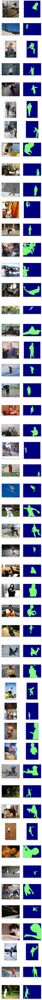

In [212]:
mtx = []

for i, info in enumerate(infos[50:100]):
    print(i, info)
    img = load_image(info)
    head, body, mask = create_mask(info)
    mtx.append([
        (lambda img: lambda x: plt.imshow(img))(img),
        (lambda mask: lambda x: plt.imshow(mask))(mask)
    ])

mtx_plot(mtx, (6, 6))


In [175]:
seq = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.ContrastNormalization((0.5, 2.0), per_channel=0.5),
    iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
            translate_px={"x": (-16, 16), "y": (-16, 16)}, # translate by -16 to +16 pixels (per axis)
            rotate=(-45, 45), # rotate by -45 to +45 degrees
            shear=(-16, 16), # shear by -16 to +16 degrees
            #order=iaa.ALL, # use any of scikit-image's interpolation methods
            #cval=(0, 255), # if mode is constant, use a cval between 0 and 255
            mode="wrap" # use any of scikit-image's warping modes (see 2nd image from the top for examples)
    ),
]).to_deterministic() # type: iaa.Sequential

In [29]:
cats_num = len([cat['name'] for cat in coco.loadCats(coco.getCatIds())]) # type: int

class CamVid(dataset_mixin.DatasetMixin):
    def __init__(self):
            self.infos = coco.loadImgs(coco.getImgIds(catIds=coco.getCatIds(catNms=['person']))) # type: List[dict]
    def __len__(self):
        return len(self.infos)
    def get_example(self, i):
        info = self.infos[i]
        img, mask = load_img(info)
        img = np.expand_dims(img, axis=0)
        mask = np.expand_dims(mask, axis=0)
        img = seq.augment_images(img)
        mask = seq.augment_images(mask)
        img = np.squeeze(img)
        mask = np.squeeze(mask)
        img = cv2.resize(img, (256, 256))
        mask = cv2.resize(mask, (256, 256))
        return (img, mask)

def load_img(imgInfo: dict) -> Tuple[np.ndarray, np.ndarray]:
    img = io.imread(imgInfo['coco_url'])
    anns = coco.loadAnns(coco.getAnnIds(imgIds=[imgInfo['id']],iscrowd=False)) # type: List[dict]
    mask_all = np.zeros((img.shape[0], img.shape[1]), np.uint8)
    for ann in anns:
        cat = coco.loadCats([ann["category_id"]])[0]
        if cat["name" ] != "person": continue
        rles = mask.frPyObjects(ann["segmentation"], img.shape[0], img.shape[1]) # type: List[dict]
        for i, rle in enumerate(rles):
            mask_img = mask.decode(rle) # type: np.ndarray
            mask_img[mask_img > 0] = 255
            mask_all += mask_img
    return (img, mask_all)



In [30]:
def convert_to_keras_batch(iter: Iterator[List[Tuple[np.ndarray, np.ndarray]]]) -> Iterator[Tuple[np.ndarray, np.ndarray]] :
    while True:
        batch = iter.__next__() # type: List[Tuple[np.ndarray, np.ndarray]]
        xs = [x for (x, _) in batch] # type: List[np.ndarray]
        ys = [y for (_, y) in batch] # type: List[np.ndarray]
        _xs = np.array(xs) # (n, 480, 360, 3)
        _ys = np.array(ys) # (n, 480, 360, n_classes)
        yield (_xs, _ys)


In [31]:
train_iter = convert_to_keras_batch(
    SerialIterator(
    #MultiprocessIterator(
        CamVid(),
        batch_size=1,
        #n_processes=2,
        #n_prefetch=2,
        #shared_mem=1000*1000*5
    )
)


person
person
person
person
person
person
person
person
person
person
person
person
person
person
person
person


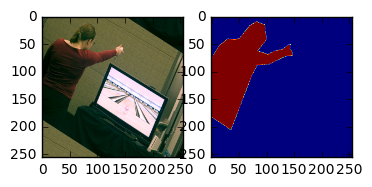

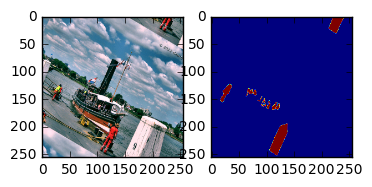

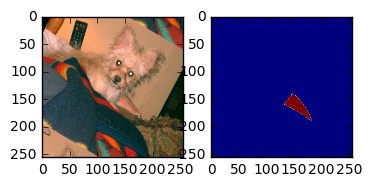

In [33]:
for (a,b), _ in zip(train_iter, range(3)):
    mtx_plot([[lambda x: plt.imshow(np.squeeze(a)), lambda x: plt.imshow(np.squeeze(b))]], (2, 2))

In [215]:
0<3<3

False